run this file in google collab, change the dataset according to your needs, get the dataset from https://universe.roboflow.com this website, its opensource.

In [ ]:
!nvidia-smi

/bin/bash: line 1: nvidia-smi: command not found


In [ ]:
import torch
print("GPU Available:", torch.cuda.is_available())

GPU Available: True


In [ ]:
!pip install ultralytics opencv-python numpy roboflow

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 922.2/922.2 kB 35.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 83.1/83.1 kB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 16.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 102.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 85.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 54.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 14.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2

In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="T5jH6kIsGs7kWWkeKG0G")
project = rf.workspace("bangga").project("ppe-2-ynh14")
version = project.version(2)
dataset = version.download("yolov11")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to PPE-2-2 in yolov11:: 100%|██████████| 17462/17462 [00:02<00:00, 6106.12it/s]


In [ ]:
from ultralytics import YOLO

# Load pre-trained model
model = YOLO("yolo11n.pt")

# Train on Roboflow dataset
model.train(
    data=f"{dataset.location}/data.yaml",
    epochs=50,
    imgsz=640,
    batch=16,  # Use larger batches with GPU
    device=0,  # GPU
    project="ppe-detection",
    name="colab-training"
)

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


100%|██████████| 5.35M/5.35M [00:00<00:00, 162MB/s]


Ultralytics 8.3.85 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolo11n.pt, data=/content/PPE-2-2/data.yaml, epochs=50, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=ppe-detection, name=colab-training, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=T

100%|██████████| 755k/755k [00:00<00:00, 42.2MB/s]


Overriding model.yaml nc=80 with nc=16

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      6640  ultralytics.nn.modules.block.C3k2            [32, 64, 1, False, 0.25]      
  3                  -1  1     36992  ultralytics.nn.modules.conv.Conv             [64, 64, 3, 2]                
  4                  -1  1     26080  ultralytics.nn.modules.block.C3k2            [64, 128, 1, False, 0.25]     
  5                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              
  6                  -1  1     87040  ultralytics.nn.modules.block.C3k2            [128, 128, 1, True]           
  7                  -1  1    295424  ultralytic

train: Scanning /content/PPE-2-2/train/labels... 6993 images, 82 backgrounds, 0 corrupt: 100%|██████████| 6993/6993 [00:03<00:00, 2244.18it/s]


train: New cache created: /content/PPE-2-2/train/labels.cache
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 6, len(boxes) = 25288. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/PPE-2-2/valid/labels... 1325 images, 10 backgrounds, 0 corrupt: 100%|██████████| 1325/1325 [00:01<00:00, 942.08it/s]

val: New cache created: /content/PPE-2-2/valid/labels.cache
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 137, len(boxes) = 3946. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.


Plotting labels to ppe-detection/colab-training/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.0005, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to ppe-detection/colab-training
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      2.74G        1.4      2.924      1.509          2        640: 100%|██████████| 438/438 [02:19<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 42/42 [00:13<00:00,  3.19it/s]


                   all       1325       3946      0.762      0.382      0.384      0.236

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      2.68G      1.341      1.902      1.442          7        640: 100%|██████████| 438/438 [02:12<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 42/42 [00:11<00:00,  3.55it/s]


                   all       1325       3946      0.709      0.411      0.398      0.238

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      2.49G      1.335      1.715       1.43         12        640: 100%|██████████| 438/438 [02:12<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 42/42 [00:11<00:00,  3.61it/s]


                   all       1325       3946      0.734      0.422      0.414      0.249

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      2.62G      1.319      1.598      1.421          8        640: 100%|██████████| 438/438 [02:11<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 42/42 [00:11<00:00,  3.52it/s]


                   all       1325       3946      0.656      0.446      0.438      0.274

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      2.49G      1.292      1.484      1.405          6        640: 100%|██████████| 438/438 [02:09<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 42/42 [00:11<00:00,  3.51it/s]


                   all       1325       3946      0.816      0.427      0.469      0.285

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50       2.6G       1.29      1.416      1.404          4        640: 100%|██████████| 438/438 [02:10<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 42/42 [00:11<00:00,  3.54it/s]


                   all       1325       3946      0.638      0.456      0.486      0.298

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      2.68G      1.252      1.334      1.374         10        640: 100%|██████████| 438/438 [02:11<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 42/42 [00:11<00:00,  3.56it/s]


                   all       1325       3946       0.66      0.517      0.505      0.312

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      2.57G      1.245      1.293      1.365          5        640: 100%|██████████| 438/438 [02:10<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 42/42 [00:12<00:00,  3.50it/s]


                   all       1325       3946      0.643       0.52      0.499      0.316

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      2.51G       1.22      1.253       1.35          4        640: 100%|██████████| 438/438 [02:11<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 42/42 [00:12<00:00,  3.48it/s]


                   all       1325       3946      0.697       0.51      0.517      0.327

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      2.49G      1.218      1.231      1.352          3        640: 100%|██████████| 438/438 [02:10<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 42/42 [00:12<00:00,  3.37it/s]

                   all       1325       3946      0.617      0.539      0.513      0.327



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      2.74G       1.21       1.21      1.336          4        640: 100%|██████████| 438/438 [02:09<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 42/42 [00:11<00:00,  3.63it/s]


                   all       1325       3946      0.465      0.559       0.51      0.327

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      2.77G      1.193      1.162      1.331          9        640: 100%|██████████| 438/438 [02:09<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 42/42 [00:12<00:00,  3.49it/s]


                   all       1325       3946      0.627      0.511      0.519      0.329

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      2.46G      1.187      1.147      1.324         17        640: 100%|██████████| 438/438 [02:11<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 42/42 [00:11<00:00,  3.69it/s]

                   all       1325       3946      0.772        0.5      0.569       0.35



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      2.49G      1.172      1.117      1.317          4        640: 100%|██████████| 438/438 [02:09<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 42/42 [00:11<00:00,  3.54it/s]


                   all       1325       3946      0.644      0.519      0.535       0.34

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      2.63G      1.157      1.094        1.3          3        640: 100%|██████████| 438/438 [02:09<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 42/42 [00:11<00:00,  3.55it/s]


                   all       1325       3946      0.542      0.555      0.561      0.359

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      2.58G      1.159      1.085      1.306          2        640: 100%|██████████| 438/438 [02:09<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 42/42 [00:11<00:00,  3.65it/s]

                   all       1325       3946      0.504      0.584      0.552      0.352



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      2.48G      1.138      1.062       1.29          4        640: 100%|██████████| 438/438 [02:09<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 42/42 [00:11<00:00,  3.61it/s]


                   all       1325       3946      0.568      0.547      0.558      0.344

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      2.58G      1.141      1.052      1.292          4        640: 100%|██████████| 438/438 [02:07<00:00,  3.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 42/42 [00:11<00:00,  3.57it/s]


                   all       1325       3946      0.554      0.583      0.557      0.355

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      2.55G      1.132      1.033      1.286          8        640: 100%|██████████| 438/438 [02:08<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 42/42 [00:11<00:00,  3.55it/s]


                   all       1325       3946      0.655      0.554      0.556      0.352

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      2.57G      1.124      1.016      1.278          2        640: 100%|██████████| 438/438 [02:09<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 42/42 [00:11<00:00,  3.63it/s]


                   all       1325       3946      0.506      0.621      0.571      0.361

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      2.51G      1.121      1.012      1.279          1        640: 100%|██████████| 438/438 [02:08<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 42/42 [00:11<00:00,  3.56it/s]

                   all       1325       3946      0.586      0.606      0.599      0.371



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      2.62G      1.108     0.9956       1.27          3        640: 100%|██████████| 438/438 [02:09<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 42/42 [00:11<00:00,  3.59it/s]


                   all       1325       3946      0.668       0.55      0.575      0.361

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      2.58G      1.106     0.9847      1.272          4        640: 100%|██████████| 438/438 [02:09<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 42/42 [00:11<00:00,  3.60it/s]


                   all       1325       3946      0.583      0.582      0.593      0.377

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      2.53G      1.099     0.9819       1.27          2        640: 100%|██████████| 438/438 [02:14<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 42/42 [00:12<00:00,  3.49it/s]

                   all       1325       3946      0.534      0.621      0.584      0.369



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      2.58G      1.091     0.9634      1.264          7        640: 100%|██████████| 438/438 [02:12<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 42/42 [00:11<00:00,  3.54it/s]


                   all       1325       3946       0.59      0.616        0.6       0.38

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      2.46G      1.076     0.9481       1.25          2        640: 100%|██████████| 438/438 [02:10<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 42/42 [00:11<00:00,  3.58it/s]


                   all       1325       3946      0.552      0.633      0.605      0.384

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50       2.5G      1.064     0.9775      1.236          0        640: 100%|██████████| 438/438 [02:08<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 42/42 [00:11<00:00,  3.60it/s]


                   all       1325       3946      0.579      0.564      0.581      0.372

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      2.54G      1.075     0.9354      1.247          6        640: 100%|██████████| 438/438 [02:10<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 42/42 [00:11<00:00,  3.50it/s]


                   all       1325       3946       0.71      0.533      0.586      0.377

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      2.61G      1.064     0.9337      1.239          1        640: 100%|██████████| 438/438 [02:10<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 42/42 [00:11<00:00,  3.55it/s]


                   all       1325       3946      0.561      0.605      0.587      0.379

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      2.57G      1.058     0.9087      1.237          3        640: 100%|██████████| 438/438 [02:10<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 42/42 [00:11<00:00,  3.61it/s]


                   all       1325       3946      0.611      0.616      0.603      0.386

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      2.71G      1.048     0.9057       1.23          5        640: 100%|██████████| 438/438 [02:11<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 42/42 [00:11<00:00,  3.55it/s]


                   all       1325       3946      0.723       0.59      0.607       0.39

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      2.59G      1.042     0.8968      1.232          1        640: 100%|██████████| 438/438 [02:10<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 42/42 [00:11<00:00,  3.57it/s]


                   all       1325       3946      0.523      0.629      0.593      0.381

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      2.65G      1.031     0.9023      1.218          0        640: 100%|██████████| 438/438 [02:09<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 42/42 [00:12<00:00,  3.30it/s]


                   all       1325       3946       0.59      0.633      0.613      0.391

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      2.46G      1.037     0.8821      1.226          8        640: 100%|██████████| 438/438 [02:10<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 42/42 [00:11<00:00,  3.55it/s]


                   all       1325       3946      0.547      0.648      0.624      0.395

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      2.92G      1.029     0.8782      1.217          4        640: 100%|██████████| 438/438 [02:10<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 42/42 [00:11<00:00,  3.54it/s]

                   all       1325       3946      0.589      0.618      0.605      0.385



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      2.62G      1.023     0.8635      1.218          9        640: 100%|██████████| 438/438 [02:10<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 42/42 [00:11<00:00,  3.59it/s]

                   all       1325       3946      0.603      0.606      0.605      0.387



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      2.56G      1.015     0.8598      1.212          0        640: 100%|██████████| 438/438 [02:11<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 42/42 [00:11<00:00,  3.57it/s]


                   all       1325       3946      0.671      0.596      0.608      0.394

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50       2.4G      1.008     0.8478      1.207          6        640: 100%|██████████| 438/438 [02:08<00:00,  3.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 42/42 [00:11<00:00,  3.61it/s]


                   all       1325       3946       0.61      0.639      0.626      0.404

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50       2.5G      1.001      0.839      1.203          3        640: 100%|██████████| 438/438 [02:10<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 42/42 [00:11<00:00,  3.62it/s]

                   all       1325       3946      0.609      0.609      0.613      0.397



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      2.48G          1       0.84      1.199          4        640: 100%|██████████| 438/438 [02:11<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 42/42 [00:11<00:00,  3.64it/s]

                   all       1325       3946      0.568      0.625      0.611      0.393


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      2.55G     0.9745     0.7634      1.221          7        640: 100%|██████████| 438/438 [02:05<00:00,  3.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 42/42 [00:11<00:00,  3.72it/s]


                   all       1325       3946      0.528      0.651       0.61      0.393

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      2.56G     0.9589     0.7423       1.21          2        640: 100%|██████████| 438/438 [02:04<00:00,  3.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 42/42 [00:11<00:00,  3.61it/s]


                   all       1325       3946      0.575       0.61      0.616      0.396

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      2.51G      0.951     0.7329      1.204          1        640: 100%|██████████| 438/438 [02:03<00:00,  3.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 42/42 [00:11<00:00,  3.65it/s]


                   all       1325       3946      0.575      0.627      0.612      0.395

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      2.55G     0.9423     0.7221      1.198          8        640: 100%|██████████| 438/438 [02:04<00:00,  3.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 42/42 [00:11<00:00,  3.62it/s]

                   all       1325       3946      0.576      0.608      0.612      0.392



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      2.59G     0.9422      0.718      1.204          2        640: 100%|██████████| 438/438 [02:02<00:00,  3.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 42/42 [00:11<00:00,  3.58it/s]


                   all       1325       3946      0.578      0.619      0.612      0.397

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      2.44G     0.9299     0.7041      1.187          7        640: 100%|██████████| 438/438 [02:01<00:00,  3.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 42/42 [00:11<00:00,  3.61it/s]


                   all       1325       3946      0.604      0.631      0.621      0.398

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      2.79G     0.9217     0.7005      1.187          2        640: 100%|██████████| 438/438 [02:03<00:00,  3.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 42/42 [00:11<00:00,  3.65it/s]

                   all       1325       3946      0.573      0.638      0.613        0.4



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      2.58G      0.919     0.6965      1.186          1        640: 100%|██████████| 438/438 [02:02<00:00,  3.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 42/42 [00:11<00:00,  3.58it/s]

                   all       1325       3946      0.603      0.617      0.616      0.402



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      2.73G     0.9137     0.6898       1.18          3        640: 100%|██████████| 438/438 [02:04<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 42/42 [00:11<00:00,  3.74it/s]

                   all       1325       3946      0.675      0.617      0.619      0.401



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50       2.6G     0.9053     0.6844      1.171          9        640: 100%|██████████| 438/438 [02:02<00:00,  3.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 42/42 [00:11<00:00,  3.60it/s]


                   all       1325       3946      0.608      0.623      0.621      0.403

50 epochs completed in 1.973 hours.
Optimizer stripped from ppe-detection/colab-training/weights/last.pt, 5.5MB
Optimizer stripped from ppe-detection/colab-training/weights/best.pt, 5.5MB

Validating ppe-detection/colab-training/weights/best.pt...
Ultralytics 8.3.85 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 100 layers, 2,585,272 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 42/42 [00:16<00:00,  2.58it/s]


                   all       1325       3946       0.61      0.639      0.626      0.404
        Ear Protectors          8         15      0.609      0.267      0.303      0.157
               Glasses        403        429      0.815      0.852      0.902      0.504
                Gloves        406        654       0.76       0.92      0.886      0.598
                Helmet        382        484      0.861      0.956       0.95      0.671
                  Mask        119        120       0.91      0.841      0.877      0.613
                Person        206        245      0.485      0.891      0.741      0.624
          Safety_shoes        165        324      0.834      0.694      0.841      0.661
                 Shoes        413        700      0.747      0.859      0.866      0.606
                  Vest        425        561      0.785      0.916      0.892      0.709
Without Ear Protectors          3          8      0.305       0.25      0.228      0.106
         Without Glas

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 15])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7e83e9a44a10>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,   

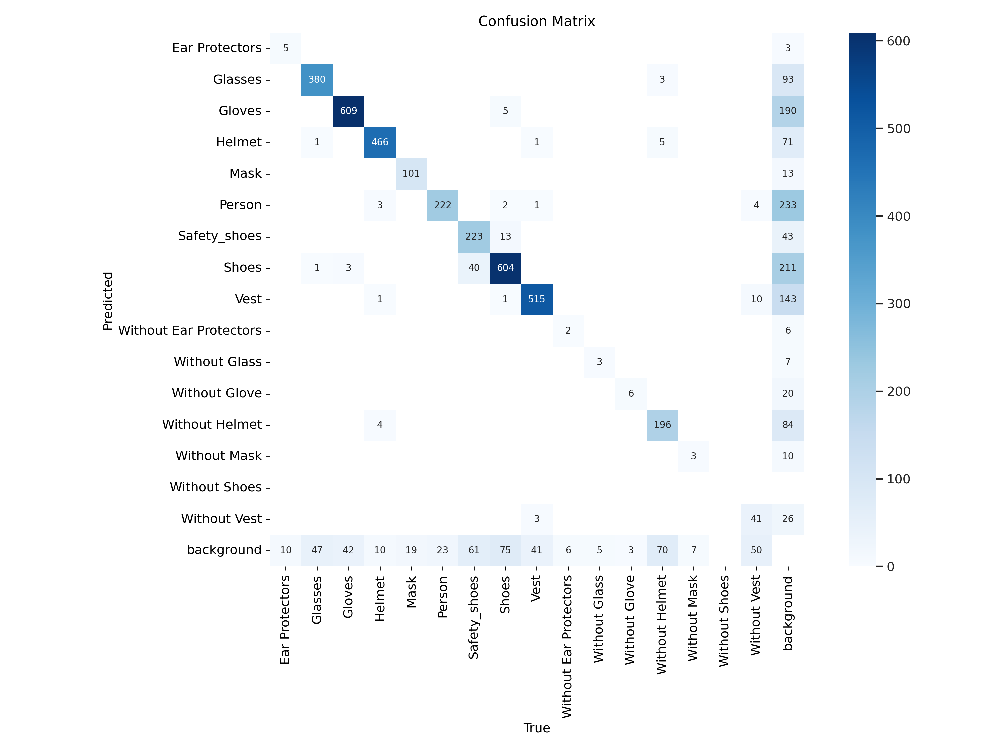

In [ ]:
from IPython.display import Image

Image("/content/ppe-detection/colab-training/confusion_matrix.png", width=600)

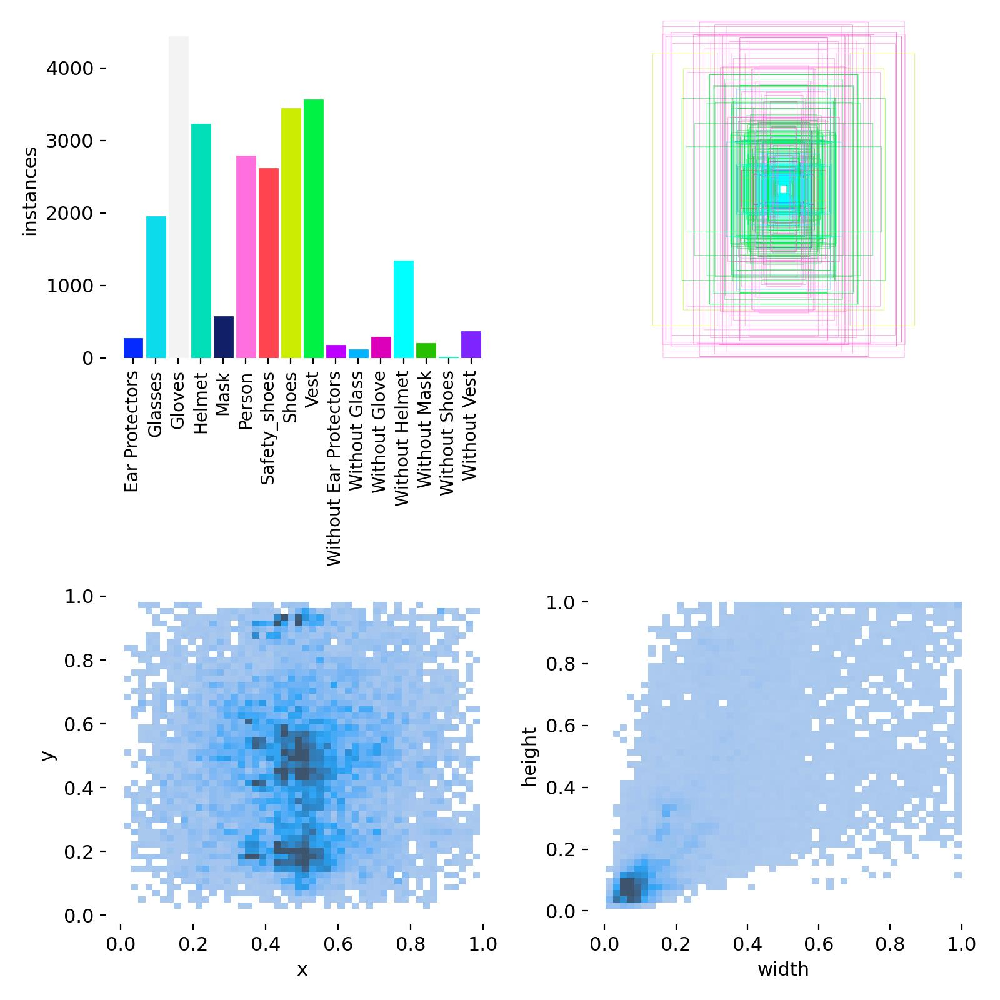

In [ ]:
from IPython.display import Image

Image("/content/ppe-detection/colab-training/labels.jpg", width=600)

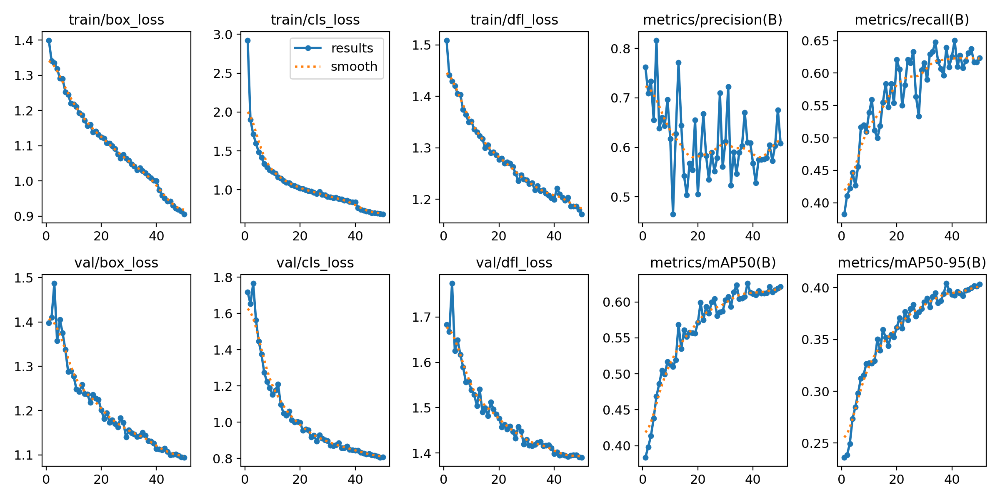

In [ ]:
from IPython.display import Image

Image("/content/ppe-detection/colab-training/results.png", width=600)

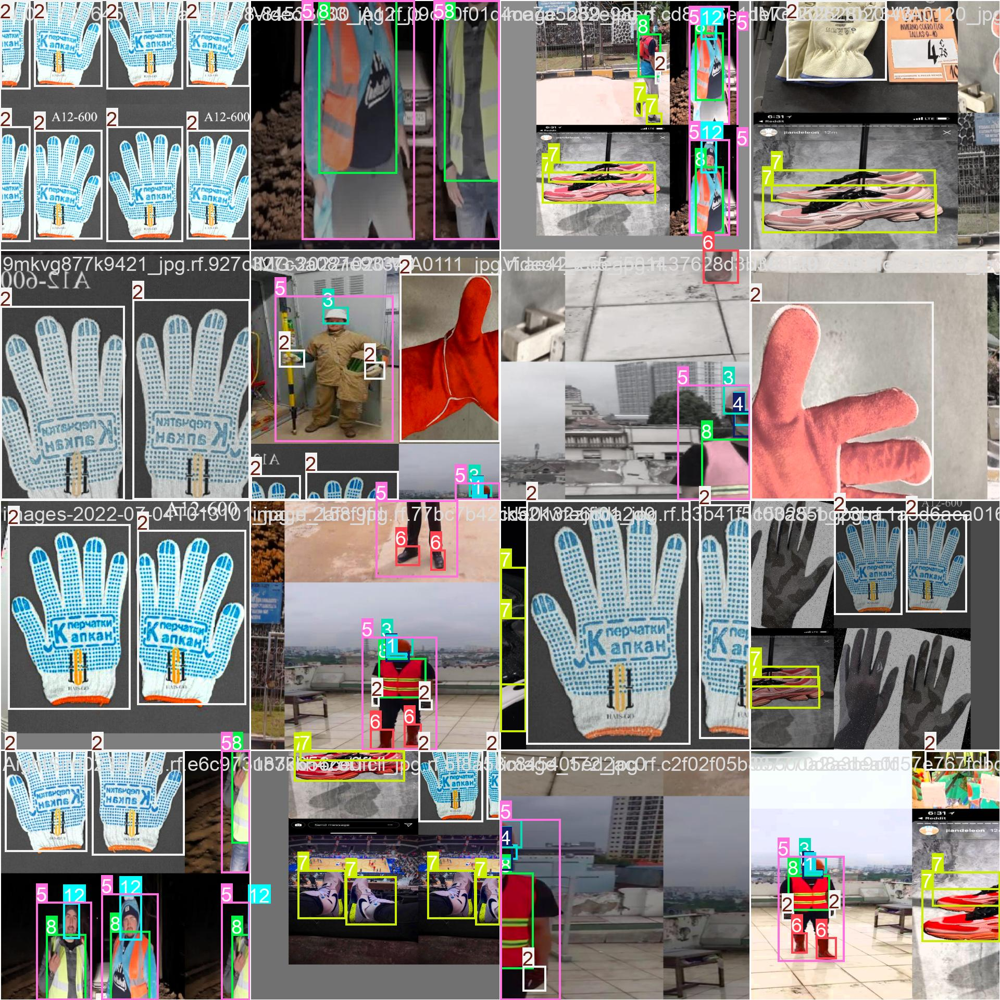

In [ ]:
from IPython.display import Image

Image("/content/ppe-detection/colab-training/train_batch0.jpg", width=600)

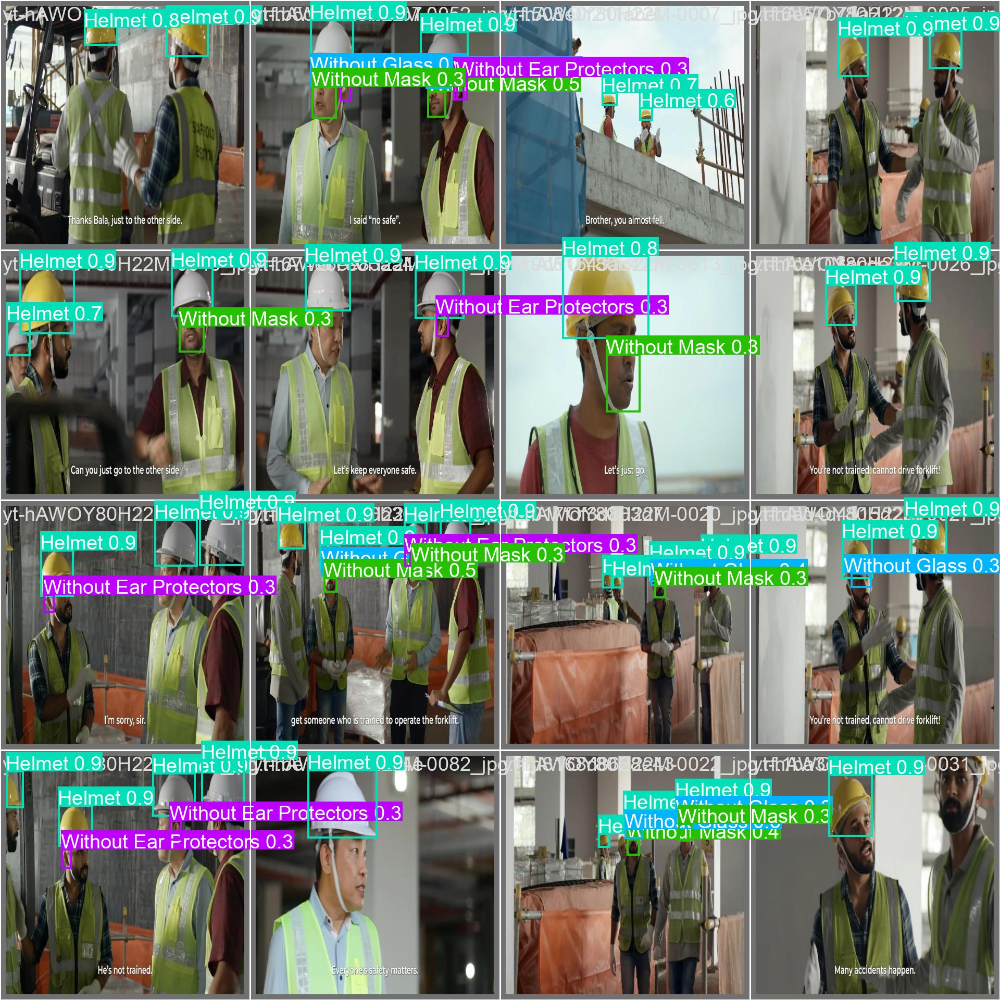

In [ ]:
from IPython.display import Image

Image("/content/ppe-detection/colab-training/val_batch0_pred.jpg", width=600)

In [ ]:
import locale
locale.getpreferredencoding = lambda:"UTF-8"

In [ ]:
!yolo task=detect mode=predict model="/content/ppe-detection/colab-training/weights/best.pt" conf=0.25 source={dataset.location}/test/images save=True

Ultralytics 8.3.85 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 100 layers, 2,585,272 parameters, 0 gradients, 6.3 GFLOPs

image 1/407 /content/PPE-2-2/test/images/00122_jpg.rf.b637d9b5a7d7419085b406d9728d8d0e.jpg: 640x640 1 Vest, 11.5ms
image 2/407 /content/PPE-2-2/test/images/101_jpg.rf.b51a6c4c2512aca984fdb1c04b9d4e60.jpg: 640x640 1 Shoes, 8.6ms
image 3/407 /content/PPE-2-2/test/images/107_jpg.rf.9b9a6a1b07ca1a9577cbd10572b0125f.jpg: 640x640 1 Shoes, 8.1ms
image 4/407 /content/PPE-2-2/test/images/126_jpg.rf.4aab48baee1567f92235088b3b7bae0c.jpg: 640x640 1 Shoes, 8.2ms
image 5/407 /content/PPE-2-2/test/images/126_jpg.rf.6257dfc3646cbab4ec090538247beafb.jpg: 640x640 1 Shoes, 8.6ms
image 6/407 /content/PPE-2-2/test/images/12_jpg.rf.26191e19ac8dc4a6bebd22c094a199fc.jpg: 640x640 1 Shoes, 8.8ms
image 7/407 /content/PPE-2-2/test/images/133_jpg.rf.6f650b5f6c3a3be7c9f432a997835d65.jpg: 640x640 1 Shoes, 8.0ms
image 8/407 /content/PPE-2-2/test/images/1

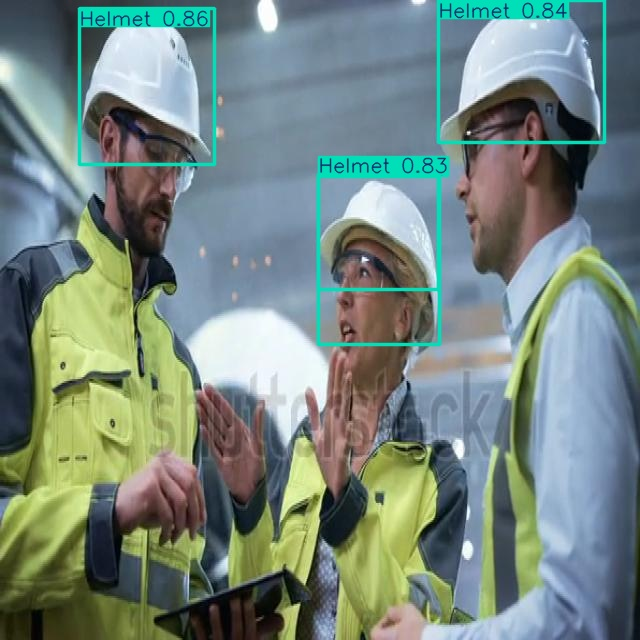

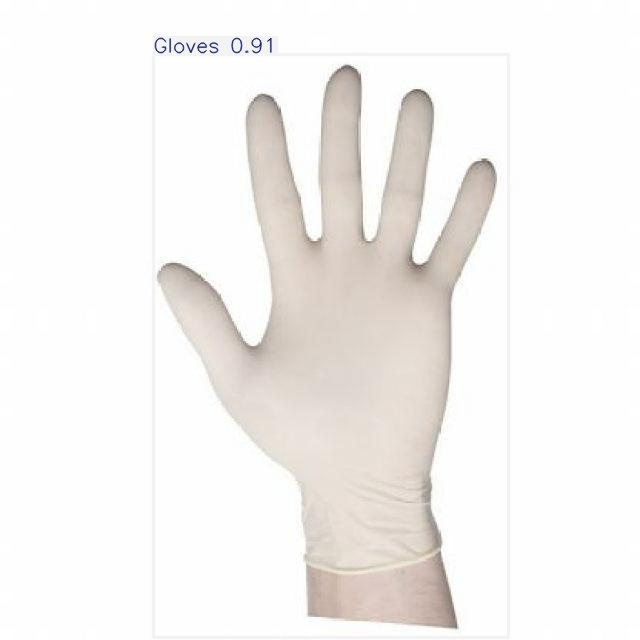

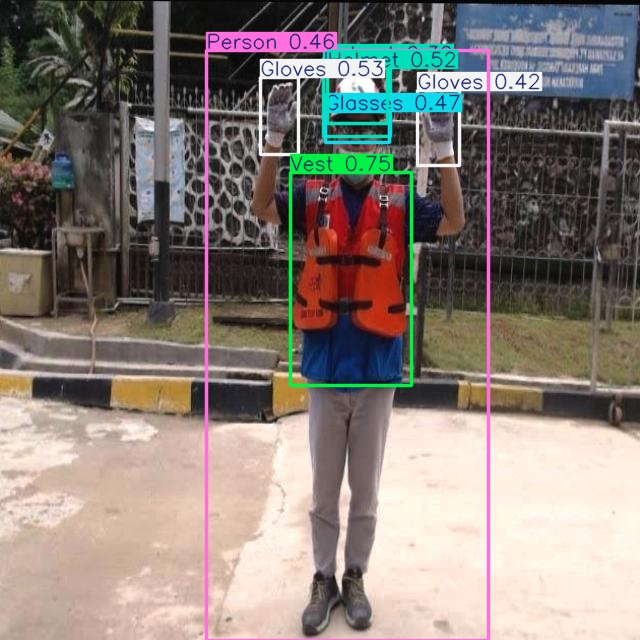

In [ ]:
import glob
import os
from IPython.display import Image as IPyImage, display

latest_folder = max(glob.glob('/content/runs/detect/predict*/'), key=os.path.getmtime)
for img in glob.glob(f'{latest_folder}/*.jpg')[1:4]:
    display(IPyImage(filename=img, width=600))
    print("\n")

In [ ]:
!yolo task=detect mode=predict model= "/content/ppe-detection/colab-training/weights/best.pt" conf=0.25 source=garib.png save=True

Ultralytics 8.3.85 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 100 layers, 2,585,272 parameters, 0 gradients, 6.3 GFLOPs

image 1/1 /content/garib.png: 640x448 1 Glasses, 1 Helmet, 1 Person, 1 Vest, 1 Without Helmet, 41.3ms
Speed: 3.7ms preprocess, 41.3ms inference, 141.8ms postprocess per image at shape (1, 3, 640, 448)
Results saved to runs/detect/predict4
💡 Learn more at https://docs.ultralytics.com/modes/predict


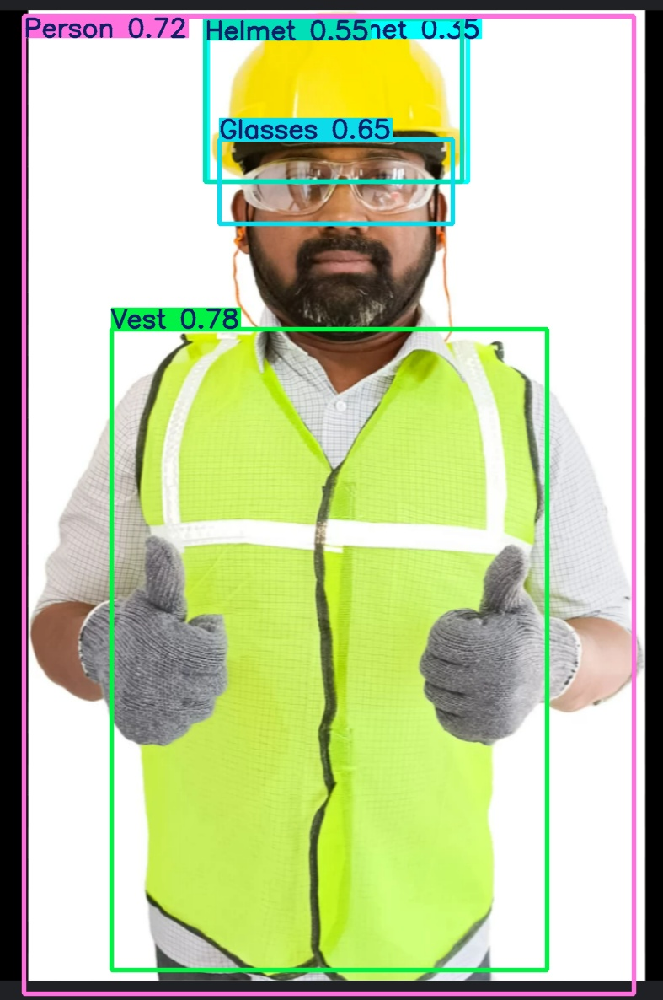

In [ ]:
from IPython.display import Image

Image("/content/runs/detect/predict2/garib.jpg", width=600)

In [ ]:
!yolo task=detect mode=predict model= "/content/ppe-detection/colab-training/weights/best.pt" conf=0.25 source="vidWorker.mp4" save=True

Ultralytics 8.3.85 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 100 layers, 2,585,272 parameters, 0 gradients, 6.3 GFLOPs

video 1/1 (frame 1/487) /content/vidWorker.mp4: 384x640 1 Glasses, 1 Helmet, 1 Without Helmet, 46.8ms
video 1/1 (frame 2/487) /content/vidWorker.mp4: 384x640 1 Glasses, 1 Helmet, 1 Without Helmet, 9.0ms
video 1/1 (frame 3/487) /content/vidWorker.mp4: 384x640 1 Glasses, 1 Helmet, 1 Without Helmet, 9.1ms
video 1/1 (frame 4/487) /content/vidWorker.mp4: 384x640 1 Glasses, 1 Helmet, 1 Without Helmet, 10.0ms
video 1/1 (frame 5/487) /content/vidWorker.mp4: 384x640 1 Glasses, 1 Helmet, 1 Without Helmet, 10.5ms
video 1/1 (frame 6/487) /content/vidWorker.mp4: 384x640 1 Glasses, 1 Helmet, 8.5ms
video 1/1 (frame 7/487) /content/vidWorker.mp4: 384x640 1 Glasses, 1 Helmet, 9.6ms
video 1/1 (frame 8/487) /content/vidWorker.mp4: 384x640 1 Glasses, 1 Helmet, 8.3ms
video 1/1 (frame 9/487) /content/vidWorker.mp4: 384x640 1 Glasses, 1 Helmet, 

In [ ]:

from IPython.display import HTML
from base64 import b64encode
import os

# Input video path
save_path = '/content/runs/detect/predict5/vidWorker.avi'

# Compressed video path
compressed_path = "/content/result_compressed.mp4"

os.system(f"ffmpeg -i {save_path} -vcodec libx264 {compressed_path}")

# Show video
mp4 = open(compressed_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=600 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url) # Added a placeholder '%s' for the data_url variable in the HTML string